# ライブラリ

In [1]:
# 標準ライブラリ
import argparse
import csv
import glob
import itertools
import math
import os
import re
import shutil
import unicodedata
import zipfile
from datetime import date, datetime, timedelta

# サードパーティライブラリ
import japanize_matplotlib
import matplotlib
import matplotlib.pyplot as plt
import MeCab
import networkx as nx
import numpy as np
import ot
import pandas as pd
import plotly.express as px
import pyper
import requests
import scipy
import swifter
from bs4 import BeautifulSoup
from gensim.models import KeyedVectors
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from matplotlib import font_manager
from pyvis.network import Network
from sklearn.manifold import TSNE
from tqdm.notebook import tqdm


## モデル読み出し

## 形態素解析モデル呼び出し

In [2]:
mt = MeCab.Tagger(r'-d "C:\Program Files\MeCab\dic\ipadic-UTF8" -u "C:\Program Files\MeCab\dic\NEologd\NEologd.2020910-u.dic"')

## word2vecモデル呼び出し

In [3]:
wv = KeyedVectors.load_word2vec_format(r"D:\データベース\企業戦略\コーパス辞書\東北大幹モデル\jawiki.all_vectors.300d.txt", binary=False) 
entity_300 = KeyedVectors.load_word2vec_format(r"D:\データベース\企業戦略\コーパス辞書\東北大幹モデル\jawiki.entity_vectors.300d.txt", binary=False)
word_300 = KeyedVectors.load_word2vec_format(r"D:\データベース\企業戦略\コーパス辞書\東北大幹モデル\jawiki.word_vectors.300d.txt", binary=False) 
word_200 = KeyedVectors.load_word2vec_format(r"D:\データベース\企業戦略\コーパス辞書\東北大幹モデル\jawiki.word_vectors.200d.txt", binary=False) 

# 有価証券報告書メタデータ

In [4]:
df_meta = pd.read_csv(r"D:\データベース\企業戦略\EDINET\有価証券報告書のアーカイブ_千葉商科大教授作成\edinet_metadata_2023-01-31.csv")

# 東北大WRD計算関数

In [5]:
# ---- テキスト類似度計算ユーティリティ ----
def get_w(text, mt, wv):
    """MeCabで分かち書きし、語彙に存在する単語ベクトルを取り出す。"""
    kws = mt.parse(text).split()
    w = [np.array(wv[kw]) for kw in kws if kw in wv]
    return w


def get_z(w):
    """重み正規化用に、ベクトルノルムの総和を計算する。"""
    z = 0
    for w_i in w:
        z += np.linalg.norm(w_i)
    return z


def cos_sim(v1, v2):
    """コサイン類似度。"""
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))


def calc_WRD(s1, s2, mt, wv):
    """Word Rotator's Distance を計算する。"""
    # NOTE: 既存処理との互換性を優先し、word_300 をそのまま使用。
    w1 = get_w(s1, mt, word_300)
    w2 = get_w(s2, mt, word_300)

    z1 = get_z(w1)
    z2 = get_z(w2)

    m1 = [np.linalg.norm(w1_i) / z1 for w1_i in w1]
    m2 = [np.linalg.norm(w2_i) / z2 for w2_i in w2]

    # コスト行列 C を作成（1 - cosine similarity）
    c = []
    for w1_i in tqdm(w1):
        c.append([1 - cos_sim(np.array(w1_i), np.array(w2_j)) for w2_j in w2])

    # Earth Mover's Distance を解く
    _, wrd = ot.emd(m1, m2, c, log=True)

    return wrd['cost']


# 有価証券取引報告書テキストデータ読み込み

In [5]:
FY_list = list(range(2014,2023,1))

In [6]:
df=pd.DataFrame()

In [ ]:
#本命
k = 0
for i in tqdm(range(len(FY_list))):
    
    #有報のあるフォルダをカレントディレクトリに設定
    os.chdir(fr"D:\データベース\企業戦略\EDINET\有価証券報告書のアーカイブ_千葉商科大教授作成\{FY_list[i]}\{FY_list[i]}")
    対象ファイルリスト =  os.listdir(path=".")


    for company in tqdm(対象ファイルリスト):
        try:
        #2章のhmlファイルの読み込み
            with zipfile.ZipFile(company) as myzip:
                target_file_list = myzip.namelist()
                target_file = myzip.extract([x for x in target_file_list if "0102010" in x][0])    # zipファイルに含まれているファイルを取り出す
                with open(target_file , encoding='utf-8') as f:
                    html = f.read()
            shutil.rmtree('./XBRL/')
            soup = BeautifulSoup(html, 'html.parser')
            mojiretu = ""
            for i in range(0,len(soup.find('body').div.contents),1):
                tag_p = soup.find('body').div.contents[i]
                try:
                    tag_p.find_all('h3')
                except:
                    continue
                if "【" in str(tag_p.find_all('h3')):
                    found_values = tag_p.find_all('p')
                    text_values = list(map(lambda val: val.text,found_values))
                    mojiretu +=''.join(text_values)
                    continue
                else:
                    pass
            #4章のhtmlファイルの読み込み
            with zipfile.ZipFile(company) as myzip:
                target_file_list = myzip.namelist()
                target_file = myzip.extract([x for x in target_file_list if "0104010" in x][0])    # zipファイルに含まれているファイルを取り出す
                with open(target_file , encoding='utf-8') as f:
                    html = f.read()
            shutil.rmtree('./XBRL/')
            soup2 = BeautifulSoup(html, 'html.parser')
            for i in range(0,len(soup2.find('body').div.contents),1):
                tag_p = soup2.find('body').div.contents[i]
                try:
                    tag_p.find_all('h4')
                except:
                    continue
                if "コーポレート" in str(tag_p.find_all('h4')):
                    found_values = tag_p.find_all('p')
                    text_values = list(map(lambda val: val.text,found_values))
                    mojiretu +=''.join(text_values)
                    continue
                else:
                    pass

            #解析テキスト
            text = unicodedata.normalize("NFKD", mojiretu).replace(' ', '').replace('\n', '')

            docID = company.split('.')[0]
            code = df_meta[df_meta["docID"] == docID]["secCode"].iloc[0]
            name = df_meta[df_meta["docID"] == docID]["filerName"].iloc[0]
            startday = df_meta[df_meta["docID"] == docID]["periodStart"].iloc[0]
            endday =  df_meta[df_meta["docID"] == docID]["periodEnd"].iloc[0]
            submitday = df_meta[df_meta["docID"] == docID]["submitDateTime"].iloc[0]


            df.loc[k,"code"] = code
            df.loc[k,"name"] = name
            df.loc[k,"startday"] = startday
            df.loc[k,"endday"] = endday
            df.loc[k,"submitday"] = submitday
            df.loc[k,"text"] = text
            # print(f"{code}_{name}_{submitday}")
            k += 1
            # pd.to_pickle(df_TTR, f"C:/Users/kddi-frontier-1/Desktop/データベース/企業戦略/EDINET/有価証券報告書3/TTR値/第2章全部+コーポレート・ガバナンス/TTR_tfidf_閾値{Threshold}_類似度_{MODEL_NAME}.pkl")#保存
        except:
            docID = company.split('.')[0]
            code = df_meta[df_meta["docID"] == docID]["secCode"].iloc[0]
            name = df_meta[df_meta["docID"] == docID]["filerName"].iloc[0]
            startday = df_meta[df_meta["docID"] == docID]["periodStart"].iloc[0]
            endday =  df_meta[df_meta["docID"] == docID]["periodEnd"].iloc[0]
            submitday = df_meta[df_meta["docID"] == docID]["submitDateTime"].iloc[0]
            df.loc[k,"code"] = code
            df.loc[k,"name"] = name
            df.loc[k,"startday"] = startday
            df.loc[k,"endday"] = endday
            df.loc[k,"submitday"] = submitday
            df.loc[k,"text"] = np.nan
            print(f"{code}_{name}_{submitday}_解析エラー")
            k += 1
            # pd.to_pickle(df_TTR, f"C:/Users/kddi-frontier-1/Desktop/データベース/企業戦略/EDINET/有価証券報告書3/TTR値/第2章全部+コーポレート・ガバナンス/TTR_tfidf_閾値{Threshold}_類似度_{MODEL_NAME}.pkl")#保存
            continue

    # df_TTR.to_csv(f"C:/Users/kddi-frontier-1/Desktop/データベース/企業戦略/EDINET/有価証券報告書3/TTR値/第2章全部+コーポレート・ガバナンス/TTR_tfidf_閾値{Threshold}_類似度_{MODEL_NAME}.csv", encoding = "utf_8_sig")


In [5]:
##textがないものを削除
df_dropna = df.dropna(subset=['text'])

In [6]:
df_dropna.reset_index(drop=True,inplace=True)

In [7]:
## 年度を付与

In [28]:
df_dropna["startday"] = pd.to_datetime(df_dropna["startday"])
df_dropna["endday"] = pd.to_datetime(df_dropna["endday"])

In [29]:
## 一番属する期間が長い年度をその有価証券取引報告書の年度とする
df_dropna.loc[df_dropna['endday'].dt.month >= 10, 'year'] = df_dropna['endday'].dt.year 
df_dropna.loc[df_dropna['endday'].dt.month < 4, 'year'] = df_dropna['endday'].dt.year - 1
df_dropna.loc[(df_dropna['endday'].dt.month >= 4) & (df_dropna['endday'].dt.month < 10), 'year'] = df_dropna['endday'].dt.year - 1

# 業種名を付与

## 業種メタデータを読み込み

In [20]:
df_sector = pd.read_csv(r"D:\データベース\企業戦略\EDINET\有価証券報告書のアーカイブ_千葉商科大教授作成\tse_sector_2023-01-31.csv")

In [21]:
df_sector = df_sector.drop("Unnamed: 0",axis=1)

In [22]:
df_sector = df_sector[["sec_code","type_33_code","type_33"]].drop_duplicates(subset=["sec_code"],keep="last")

In [23]:
df_dropna = pd.merge(df_dropna,df_sector,how="left",left_on=["code"],right_on=["sec_code"])

# 有価証券取引報告書のデータを使用して、doc2vecによる学習

In [14]:
# Neologdによるトークナイザー（文書ベクトル作成用・わかち書きのみ）
def mecab_tokenizer(text):
    """Doc2Vec学習向けにテキストを前処理し、名詞・動詞を抽出する。"""

    # ---- 正規化・不要文字除去 ----
    replaced_text = text.lower()
    replaced_text = re.sub(r'[【】]', ' ', replaced_text)       # 【】の除去
    replaced_text = re.sub(r'[（）()]', ' ', replaced_text)     # （）の除去
    replaced_text = re.sub(r'[<>＜＞]', ' ', replaced_text)      # <> の除去
    replaced_text = re.sub(r'[［］\[\]]', ' ', replaced_text)  # ［］[] の除去
    replaced_text = re.sub(r'[@＠]\w+', '', replaced_text)      # メンションの除去
    replaced_text = re.sub(r'\d+\.*\d*', '', replaced_text)   # 数字の除去

    mecab = MeCab.Tagger(r'-d "C:\Program Files\MeCab\dic\ipadic-UTF8" -u "C:\Program Files\MeCab\dic\NEologd\NEologd.2020910-u.dic"')
    parsed_lines = mecab.parse(replaced_text).splitlines()[:-1]
    surfaces = []

    for parsed_line in parsed_lines:
        surface = parsed_line.split('\t')[0]
        feature = parsed_line.split('\t')[1]
        pos = feature.split(',')[0]

        # 名詞・動詞のみを利用
        if pos in ['名詞', '動詞']:
            surfaces.append(surface)

    return surfaces


In [15]:
##証券コードのない非上場企業を削除
df_dropna = df_dropna.dropna(subset=["code"])

In [16]:
##年度が重複している行を削除(早いほうを残す)
df_dropna = df_dropna.drop_duplicates(subset=['name',"code","year"],keep="first")

In [17]:
df_dropna.reset_index(drop=True,inplace=True)

In [ ]:
##各年度ごとに学習済みモデルを作成

In [19]:
for year in tqdm(df_dropna["year"].astype("int").unique()):
    df_dropna_year = df_dropna[df_dropna["year"] == year]
    df_dropna_year.reset_index(drop=True,inplace=True)
    sentences = make_sentences(df_dropna_year,5)
    documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(sentences)]
    model = Doc2Vec(documents, vector_size=300,  window=7, min_count=1, workers=4, epochs=20)
    model.save(fr"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_{year}.model")

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3192 [00:00<?, ?it/s]

  0%|          | 0/3387 [00:00<?, ?it/s]

  0%|          | 0/3480 [00:00<?, ?it/s]

  0%|          | 0/3575 [00:00<?, ?it/s]

  0%|          | 0/3675 [00:00<?, ?it/s]

  0%|          | 0/3749 [00:00<?, ?it/s]

  0%|          | 0/3788 [00:00<?, ?it/s]

  0%|          | 0/3845 [00:00<?, ?it/s]

  0%|          | 0/3866 [00:00<?, ?it/s]

In [29]:
##ある企業に類似度が近い企業をtopから順に出していく。
index = df_dropna_year.reset_index().query('name == "株式会社商船三井"')["index"].iloc[0]
result = pd.DataFrame(model.dv.most_similar(index,topn=60),columns=["index","類似度"])
result["corp"] = result["index"].apply(lambda x : df_dropna_year.iloc[x,1])
result

,index,類似度,corp
0,1351,0.688987,日本郵船株式会社
1,965,0.685684,川崎汽船株式会社
2,2739,0.630051,ＮＳユナイテッド海運株式会社
3,2708,0.592499,飯野海運株式会社
4,1611,0.554360,千代田化工建設株式会社
5,932,0.549189,川崎重工業株式会社
6,3130,0.538832,共栄タンカー株式会社
7,1617,0.538467,明治海運株式会社
8,917,0.538058,三菱商事株式会社
9,2316,0.535473,ＥＮＥＯＳホールディングス株式会社


# 事前学習済みdoc2vecモデルから類似度ネットワークを作成

## 隣接行列の作成

In [18]:
graphdict = {}

for year in tqdm(df_dropna["year"].astype("int").unique()):
    df_dropna_year = df_dropna[df_dropna["year"] == year]
    df_dropna_year.reset_index(drop=True,inplace=True)
    
    graph = [[0]*len(df_dropna_year) for _ in range(len(df_dropna_year))]

    souatari = []
    alls = itertools.combinations(range(len(df_dropna_year)), 2)
    
    model = Doc2Vec.load(fr"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_{year}.model")
    for i in alls:
        souatari.append(i)

    for ij in tqdm(souatari):
        i = ij[0]
        j = ij[1]
        simi = model.dv.similarity(i,j)
        graph[i][j] = simi
        graph[j][i] = simi   
    graphdict[f"graph_{year}"] = graph

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/5092836 [00:00<?, ?it/s]

  0%|          | 0/5734191 [00:00<?, ?it/s]

  0%|          | 0/6053460 [00:00<?, ?it/s]

  0%|          | 0/6388525 [00:00<?, ?it/s]

  0%|          | 0/6750975 [00:00<?, ?it/s]

  0%|          | 0/7025626 [00:00<?, ?it/s]

  0%|          | 0/7172578 [00:00<?, ?it/s]

  0%|          | 0/7390090 [00:00<?, ?it/s]

  0%|          | 0/7471045 [00:00<?, ?it/s]

## networxに落とし込む

In [46]:
graph = np.array(graph)

graph2 = graph.copy()

graph2[graph2 < 0.45] = 0

# 隣接行列(DataFrame)の読み込み
G = nx.from_numpy_array(graph2, create_using=nx.Graph())

# ノードの名前を変更する。
mapping = {k: v for k, v in zip(G.nodes, list(df_dropna_year.apply(lambda x :x["name"] + '_' +  str(x["code"])[0:4],axis=1)))}

In [47]:
# mapping = {k: v for k, v in zip(G.nodes, range(4019))}

In [48]:
# ノードの名前変更を反映
G = nx.relabel_nodes(G, mapping)

In [221]:
##KDDIだけ色変える
c = ['red' if n=="ＫＤＤＩ株式会社" else 'lightblue' for n in G.nodes()]

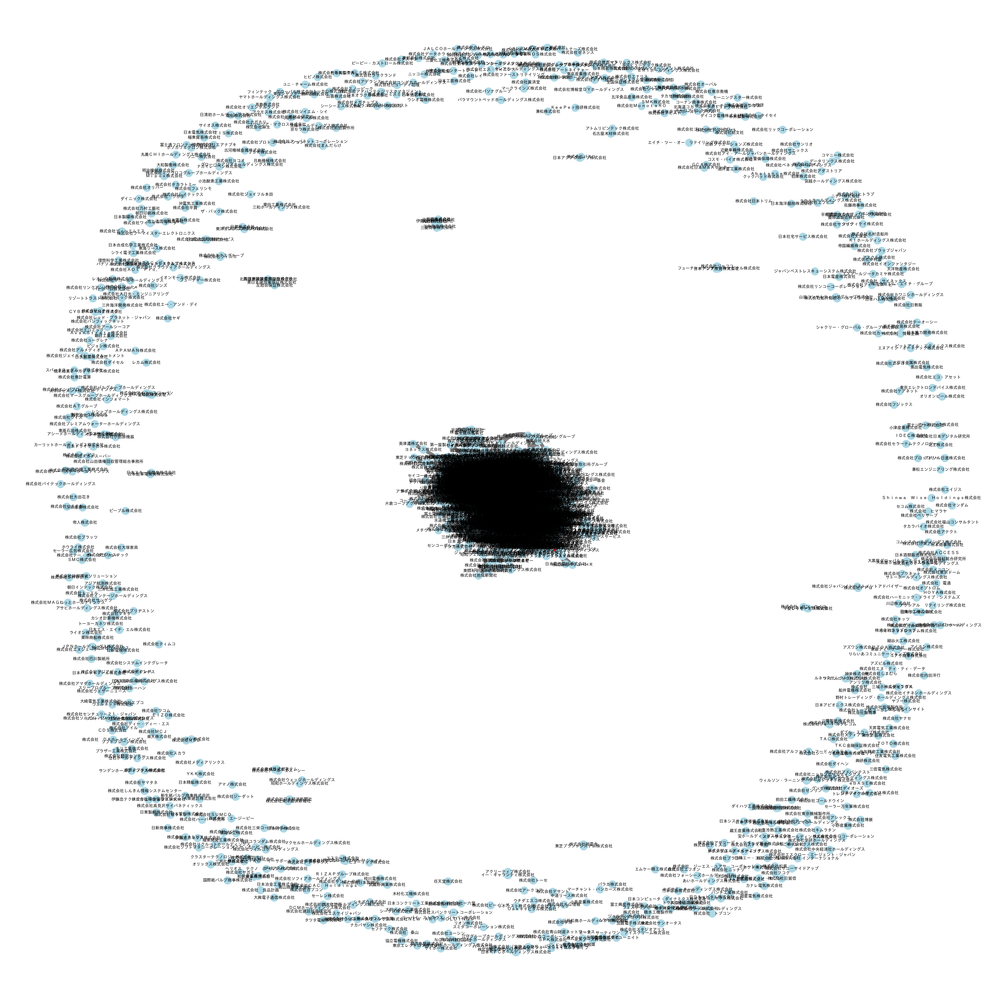

In [117]:
plt.figure(figsize=(40,40))
pos = nx.spring_layout(G,k=0.01) # グラフ形式を選択。ここではスプリングモデルでやってみる
nx.draw(G, pos, with_labels=True, node_color = c, edge_color = "gray", node_size = 500, width = 10,font_family='IPAexGothic') # グラフ描画。 オプションでノードのラベル付きにしている
plt.show() # matplotlibでグラフ表示

## ネットワークの核指標を計算

In [49]:
## 次数中心性
print('degree centrality:')
sorted(nx.degree_centrality(G).items(), key=lambda x: -x[1])[:10]

degree centrality:


[('株式会社ネクソン_3659', 0.7159120310478655),
 ('キリンホールディングス株式会社_2503', 0.6864165588615783),
 ('株式会社リクルートホールディングス_6098', 0.6600258732212161),
 ('株式会社ヤマシナ_5955', 0.32108667529107376),
 ('ＭＩＣＳ化学株式会社_7899', 0.25769728331177233),
 ('神鋼鋼線工業株式会社_5660', 0.2496765847347995),
 ('株式会社栄電子_7567', 0.24346701164294957),
 ('株式会社大紀アルミニウム工業所_5702', 0.23622250970245798),
 ('藤田エンジニアリング株式会社_1770', 0.23078913324708927),
 ('株式会社帝国電機製作所_6333', 0.22639068564036224)]

In [38]:
## 次数中心性
print('degree centrality:')
sorted(nx.degree_centrality(G).items(), key=lambda x: -x[1])[:10]

degree centrality:


[('株式会社ネクソン_3659', 0.7159120310478655),
 ('キリンホールディングス株式会社_2503', 0.6864165588615783),
 ('株式会社リクルートホールディングス_6098', 0.6600258732212161),
 ('株式会社ヤマシナ_5955', 0.32108667529107376),
 ('ＭＩＣＳ化学株式会社_7899', 0.25769728331177233),
 ('神鋼鋼線工業株式会社_5660', 0.2496765847347995),
 ('株式会社栄電子_7567', 0.24346701164294957),
 ('株式会社大紀アルミニウム工業所_5702', 0.23622250970245798),
 ('藤田エンジニアリング株式会社_1770', 0.23078913324708927),
 ('株式会社帝国電機製作所_6333', 0.22639068564036224)]

In [587]:
degree_centrality = []
for i in nx.degree_centrality(G).items():
    degree_centrality.append(i[1])

plt.hist(degree_centrality,bins=70)

In [50]:
## 固有ベクトル中心性
print('eigenvector centrality:')
sorted(nx.eigenvector_centrality(G).items(), key=lambda x: -x[1])[:10]

eigenvector centrality:


[('株式会社ネクソン_3659', 0.10022141326765537),
 ('キリンホールディングス株式会社_2503', 0.1000760852231703),
 ('株式会社リクルートホールディングス_6098', 0.09704880430305513),
 ('株式会社ヤマシナ_5955', 0.07160442709982622),
 ('ＭＩＣＳ化学株式会社_7899', 0.06213658920735049),
 ('株式会社大紀アルミニウム工業所_5702', 0.06035812267084296),
 ('株式会社イクヨ_7273', 0.06027857030480882),
 ('株式会社栄電子_7567', 0.05937194000090183),
 ('株式会社帝国電機製作所_6333', 0.059234372897265956),
 ('神鋼鋼線工業株式会社_5660', 0.059107307808466986)]

In [239]:
## 媒介中心性
print('betweenness centrality:')
sorted(nx.betweenness_centrality(G).items(), key=lambda x: -x[1])[:10]

betweenness centrality:


[('弘前ガス株式会社', 0.02648625176457774),
 ('日本観光ゴルフ株式会社', 0.01180834817836896),
 ('琉球セメント株式会社', 0.010662252385392458),
 ('株式会社\u3000明世カントリークラブ', 0.00934392637642132),
 ('ＫＯＮＯＩＫＥ\u3000Ｃｏ．株式会社', 0.008759551857574252),
 ('株式会社\u3000ナイスクラップ', 0.006931646606111494),
 ('株式会社\u3000キング', 0.006887168652380017),
 ('株式会社エスポア', 0.006636368961372012),
 ('株式会社フライングガーデン', 0.005851333599608269),
 ('日本アイ・エス・ケイ株式会社', 0.005643509704477561)]

In [529]:
## 近接中心性
print('closeness centrality:')
sorted(nx.closeness_centrality(G).items(), key=lambda x: -x[1])[:10]

closeness centrality:


[(110, 0.06543888422919683),
 (4010, 0.0654134957193116),
 (171, 0.06413209783816114),
 (3734, 0.06405899894244894),
 (551, 0.06370802388684134),
 (440, 0.06251512243845964),
 (167, 0.06212353913652381),
 (1635, 0.06159024117498653),
 (3899, 0.061377242525127634),
 (521, 0.06131028553328205)]

In [241]:
##  グラスタリング係数
print('clustering:')
sorted(nx.clustering(G).items(), key=lambda x: -x[1])[:10]

clustering:


[('株式会社ケア２１', 1.0),
 ('ファースト住建株式会社', 1.0),
 ('サムティ株式会社', 1.0),
 ('株式会社デイトナ', 1.0),
 ('Ｋ＆Ｏエナジーグループ株式会社', 1.0),
 ('リリカラ株式会社', 1.0),
 ('株式会社ペッパーフードサービス', 1.0),
 ('株式会社ノバレーゼ', 1.0),
 ('昭和シェル石油株式会社', 1.0),
 ('ＫＬａｂ株式会社', 1.0)]

In [36]:
len(nx.degree_centrality(G).items())

3866

## pyvisで可視化

In [65]:
pyvis_G = Network()
pyvis_G.from_nx(G)

In [ ]:
pyvis_G.nodes

In [257]:
for node in pyvis_G.nodes:
    if node["id"] == "ＫＤＤＩ株式会社":
        node["color"] = "red"
    else:
        node["color"]='#97c2fc'
# pyvis_G.enable_physics(True)  #html上でレイアウト動かしたくない場合false
pyvis_G.show("mygraph3.html")

In [148]:
for node in pyvis_G.nodes:
    if node["id"] == "ＫＤＤＩ株式会社":
        node["color"] = "red"
    else:
        node["color"]="lightblue"
# pyvis_G.enable_physics(True)  #html上でレイアウト動かしたくない場合false
pyvis_G.show("mygraph2.html")

# 閾値決める用の類似度のヒストグラムを作成

In [71]:
list_sim = []
for ij in tqdm(souatari):
    i = ij[0]
    j = ij[1]
    list_sim.append(graph[i][j])

  0%|          | 0/7471045 [00:00<?, ?it/s]

(array([3.00000e+00, 2.00000e+00, 1.00000e+01, 1.10000e+01, 2.10000e+01,
        4.00000e+01, 6.60000e+01, 1.20000e+02, 1.71000e+02, 2.61000e+02,
        4.76000e+02, 6.56000e+02, 1.08300e+03, 1.56300e+03, 2.48000e+03,
        3.64300e+03, 5.09600e+03, 7.17500e+03, 9.88600e+03, 1.34640e+04,
        1.83650e+04, 2.43850e+04, 3.14850e+04, 4.03470e+04, 5.05980e+04,
        6.24440e+04, 7.63170e+04, 9.12600e+04, 1.08471e+05, 1.26897e+05,
        1.46001e+05, 1.65228e+05, 1.86333e+05, 2.06138e+05, 2.25256e+05,
        2.42743e+05, 2.59355e+05, 2.73709e+05, 2.84398e+05, 2.94027e+05,
        2.99625e+05, 3.01522e+05, 3.02267e+05, 2.98606e+05, 2.92592e+05,
        2.83863e+05, 2.71380e+05, 2.58079e+05, 2.44011e+05, 2.27515e+05,
        2.11875e+05, 1.94745e+05, 1.77884e+05, 1.61084e+05, 1.45205e+05,
        1.28856e+05, 1.14338e+05, 9.93880e+04, 8.63910e+04, 7.46300e+04,
        6.34070e+04, 5.38390e+04, 4.48140e+04, 3.66590e+04, 3.02760e+04,
        2.46300e+04, 1.94530e+04, 1.51600e+04, 1.19

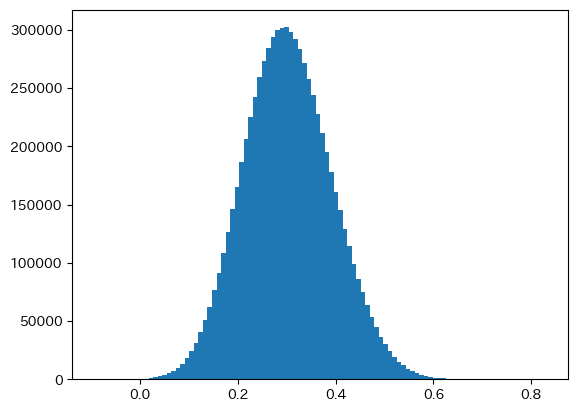

In [72]:
plt.hist(list_sim,bins=100)

# モデル、保存読み込み

## 学習モデル保存

In [60]:
## 有価証券で学習したdoc2vecモデルを保存
model.save(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep.model")

## 結果保存

In [ ]:
## 有価証券のテキスト抽出結果の生データフレームを保存
df.to_pickle(r"D:\データベース\企業戦略\df_row_secrep")

In [521]:
## 有価証券のテキスト抽出結果のデータフレームを保存
df_dropna.to_pickle(r"D:\データベース\企業戦略\df_secrep")

In [86]:
## 有価証券のネットワーク指標データフレームを保存
df_network.to_pickle(r"D:\データベース\企業戦略\df_network")

In [152]:
df_network_Zaimu.to_pickle(r"D:/データベース/企業戦略/df_network_Zaimu")

In [64]:
df_network_Zaimu.sort_values(["betweenness_centrality"], ascending=[True])[0:30]

,code,name,startday,endday,submitday,text,year,sec_code,type_33_code,type_33,...,Capitalinvestment_in_TotalAsset,FixedAsset_in_TotalAsset,CashHoldings,AssetLeverage,RDIntensity,Profitability,TobinsQ_after180days,TobinsQ_after240days,TobinsQ_after300days,TobinsQ_after360days
8730,4319,ＴＡＣ株式会社,2015-04-01,2016-03-31,2016-06-29,当連結会計年度は、2014年4月の消費税増税に伴う駆け込み申込みによる反動減の影響が落ち着...,2015,43190.0,9050,サービス業,...,0.010447,0.447208,0.331638,0.790080,0.000000,0.009893,0.985966,0.985966,0.963111,0.987426
25913,9432,日本電信電話株式会社,2020-04-01,2021-03-31,2021-06-25,文中の将来に関する事項は、本有価証券報告書提出日現在において判断したものです。(1)経営方...,2020,94320.0,5250,情報・通信業,...,0.075257,0.768071,0.041947,0.642810,0.010129,0.049111,1.145449,1.162640,1.201911,NaN
22100,4661,株式会社オリエンタルランド,2019-04-01,2020-03-31,2020-06-26,文中の将来に関する事項は、当連結会計年度末現在において当社グループが判断したものであ...,2019,46610.0,9050,サービス業,...,0.138155,0.686597,0.278200,0.188387,0.000000,0.061561,6.153023,6.629834,5.603676,5.858845
12171,9766,コナミホールディングス株式会社,2016-04-01,2017-03-31,2017-06-29,(1)業績当社グループを取り巻く経済環境は、英国の欧州連合(EU)離脱や新興国経済の減速...,2016,97660.0,5250,情報・通信業,...,0.042724,0.481088,0.399660,0.302399,0.071023,0.077050,2.988150,2.707232,2.417267,2.520019
21888,7837,株式会社アールシーコア,2019-04-01,2020-03-31,2020-06-26,文中の将来に関する事項は、当連結会計年度末現在において当社グループが判断したものであ...,2019,78370.0,3800,その他製品,...,0.027278,0.442550,0.279280,0.718975,0.013639,0.001824,0.977463,0.974603,1.042817,1.061948
15911,4825,株式会社ウェザーニューズ,2017-06-01,2018-05-31,2018-08-27,(1)実現すべきミッション当社グループの基本コンセプトは、気象から気候変動、環境に関...,2017,48250.0,5250,情報・通信業,...,0.044674,0.286004,0.498726,0.114493,0.023121,0.128339,2.520269,2.709355,2.674073,2.513340
24077,6619,ダブル・スコープ株式会社,2020-01-01,2020-12-31,2021-03-31,リチウムイオン二次電池の用途は、従来の民生機器に加え電気自動車に広がりつつあり、リチウムイ...,2020,66190.0,3650,電気機器,...,0.150085,0.764549,0.093155,0.858544,0.007789,-0.159113,1.549522,1.554951,1.499232,1.495353
5882,6083,ＥＲＩホールディングス株式会社,2014-06-01,2015-05-31,2015-08-28,当連結会計年度におけるわが国経済は、消費増税後の個人消費に弱さがみられましたが、政府の...,2014,60830.0,9050,サービス業,...,0.021223,0.230260,0.445230,0.497946,0.000000,-0.009585,1.942166,2.127328,1.937716,1.895784
26770,6083,ＥＲＩホールディングス株式会社,2020-06-01,2021-05-31,2021-08-27,文中の将来に関する事項は、当連結会計年度末現在において、当社グループが判断したもので...,2020,60830.0,9050,サービス業,...,0.048063,0.365720,0.402987,0.593759,0.000000,0.039929,1.895683,2.384485,NaN,NaN
23654,9830,トラスコ中山株式会社,2020-01-01,2020-12-31,2021-03-22,文中の将来に関する事項は、当連結会計年度末現在において当社が判断したものです。モノづく...,2020,98300.0,6050,卸売業,...,0.038596,0.508829,0.155051,0.363383,0.000000,0.038338,1.333663,1.240112,1.190491,1.140871


In [55]:
df_network_Zaimu[df_network_Zaimu["code"] == 6861]["betweenness_centrality"]

543     0.007312
3716    0.000644
Name: betweenness_centrality, dtype: float64

## 学習モデルの読み込み

In [6]:
## 有価証券で学習したdoc2vecモデルを保存

In [7]:
model = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep.model")

In [8]:
model_2013 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2013.model")
model_2014 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2014.model")
model_2015 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2015.model")
model_2016 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2016.model")
model_2017 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2017.model")
model_2018 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2018.model")
model_2019 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2019.model")
model_2020 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2020.model")
model_2021 = Doc2Vec.load(r"D:\データベース\企業戦略\doc2vec\pre_trained_model\chenzhixiong_secrep_ja\chenzhixion_secrep_2021.model")

## 結果の読み込み

In [9]:
## 有価証券のテキスト抽出結果の生データフレームを読み込み

In [10]:
df = pd.read_pickle(r"D:\データベース\企業戦略\df_row_secrep")

In [11]:
## 有価証券のテキスト抽出結果のデータフレームを読み込み

In [35]:
df_dropna = pd.read_pickle(r"D:\データベース\企業戦略\df_secrep")

In [41]:
df_network_Zaimu = pd.read_pickle(r"D:/データベース/企業戦略/df_network_Zaimu")

# 有価証券の300次元ベクトルを二次元に可視化

In [14]:
sentence_vectors = np.vstack(model.dv.vectors)

In [15]:
vectors_tsne = TSNE(n_components=2).fit_transform(sentence_vectors)

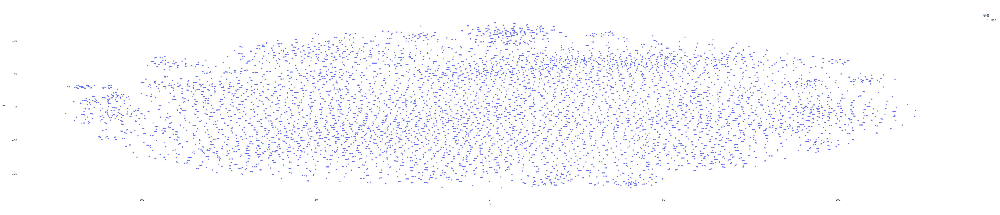

In [30]:
df_2d = pd.DataFrame(vectors_tsne).reset_index()
df_2d["corp"] = df_dropna[df_dropna["year"] == 2021].reset_index()["name"]
df_2d["業種"] = df_dropna[df_dropna["year"] == 2021].reset_index()["type_33"]

fig = px.scatter(
    df_2d, x=0, y=1,width=1000,height=1000,
    color="業種",labels={"color":"業種"},
    hover_data = ['corp']

)
fig.update_traces(marker_size=5)
fig.update_layout(plot_bgcolor="white")
fig.show()

In [60]:
fig.write_html("plotly2021.html")

# ネットワーク的特徴と企業価値との関係性に関する分析

## 財務データ読み込み

In [75]:
f2 = lambda x: x.fillna(x.mean())
Zaimu_filename = r"D:\データベース\企業戦略\Astra Maneger\年次\PBFJ論文用.csv"
df_Zaimu = pd.read_csv(Zaimu_filename, skiprows = 0, encoding = "shift-jis")
#日付情報が欠落している行は削除
df_Zaimu = df_Zaimu.dropna(subset=["期日","事業年度開始日","事業年度終了日"])
#日付変換
df_Zaimu["事業年度開始日"] = pd.to_datetime(df_Zaimu["事業年度開始日"], format='%Y/%m/%d')
df_Zaimu["事業年度終了日"] = pd.to_datetime(df_Zaimu["事業年度終了日"], format='%Y/%m/%d')

df_Zaimu["東証業種ｺｰﾄﾞ"] = pd.concat([df_Zaimu["銘柄コード"],  df_Zaimu['東証業種ｺｰﾄﾞ']],axis=1).groupby('銘柄コード').transform(f2)
df_Zaimu = df_Zaimu.drop_duplicates(keep="first", subset=["銘柄コード",'事業年度開始日'])
df_Zaimu = df_Zaimu.fillna({'設備投資額': 0, '研究開発費': 0, '有価証券' : 0, "現金･預金": 0})

df_Zaimu.loc[:,"時価総額(発行済株式)"] = df_Zaimu["時価総額(発行済株式)"]/1000000

In [76]:
df_Zaimu=df_Zaimu[["期日","決算期","事業年度開始日","事業年度終了日",'銘柄コード','銘柄名','東証業種名','東証業種名(E)','東証業種ｺｰﾄﾞ',
"純資産","売上高伸び率","設備投資額","固定資産","現金･預金","有価証券","研究開発費","当期純利益","資産合計","実績PBR","時価総額(発行済株式)","負債合計"]]
df_Zaimu["TobinsQ_1_net"]=(df_Zaimu["時価総額(発行済株式)"]+df_Zaimu["負債合計"])/df_Zaimu["資産合計"]
df_Zaimu["TobinsQ_2_paper"]=df_Zaimu["時価総額(発行済株式)"]/df_Zaimu["純資産"]
df_Zaimu["TobinsQ_3_PBR"]=df_Zaimu["実績PBR"]
df_Zaimu["Ln_NetAsset"]=df_Zaimu["純資産"].apply(np.log)
df_Zaimu["Ln_TotalAsset"] = df_Zaimu["資産合計"].apply(np.log)
df_Zaimu["SalesGrowthRate"]=df_Zaimu["売上高伸び率"]
df_Zaimu["Capitalinvestment_in_TotalAsset"]=df_Zaimu["設備投資額"]/df_Zaimu["資産合計"]
df_Zaimu["FixedAsset_in_TotalAsset"]=df_Zaimu["固定資産"]/df_Zaimu["資産合計"]
df_Zaimu["CashHoldings"]=(df_Zaimu["現金･預金"]+df_Zaimu["有価証券"])/df_Zaimu["資産合計"]
df_Zaimu["AssetLeverage"]=df_Zaimu["負債合計"]/df_Zaimu["資産合計"]
df_Zaimu["RDIntensity"]=df_Zaimu["研究開発費"]/df_Zaimu["資産合計"]
df_Zaimu["Profitability"]=df_Zaimu["当期純利益"]/df_Zaimu["資産合計"]

In [77]:
f = lambda x: x.fillna(x.mean())

df_Zaimu.reset_index(drop=True,inplace=True)

df_Zaimu_fillna = pd.concat([df_Zaimu["銘柄コード"],  df_Zaimu.iloc[:,9:]],axis=1).groupby('銘柄コード').transform(f)

df_Zaimu_fillna = pd.merge(df_Zaimu[["期日","決算期","事業年度開始日","事業年度終了日",'銘柄コード','銘柄名','東証業種名','東証業種名(E)','東証業種ｺｰﾄﾞ']],df_Zaimu_fillna,left_index=True, right_index=True)

# df_Zaimu_fillna["東証業種ｺｰﾄﾞ"] = pd.concat([df_Zaimu["銘柄コード"],  df_Zaimu["東証業種ｺｰﾄﾞ"]],axis=1).groupby('銘柄コード').transform(f2)

## ネットワーク特徴量と財務データをマージ

In [85]:
threshold = 0.45 ## コサイン類似度の閾値
df_network = pd.DataFrame()
for year in tqdm(df_dropna["year"].astype("int").unique()):
    
    df_dropna_year = df_dropna[df_dropna["year"] == year]
    df_dropna_year.reset_index(drop=True,inplace=True)
    
    graph = np.array(graphdict[f"graph_{year}"])
    graph2 = graph.copy()
    graph2[graph2 < threshold] = 0
    
    # 隣接行列(DataFrame)の読み込み
    G = nx.from_numpy_array(graph2, create_using=nx.Graph())
    # ノードの名前を変更する。
    mapping = {k: v for k, v in zip(G.nodes, list(df_dropna_year.apply(lambda x :x["name"] + '_' +  str(x["code"])[0:4],axis=1)))}
    G = nx.relabel_nodes(G, mapping)
    
    df_dropna_year["degree_centrality"] = nx.degree_centrality(G)
    df_dropna_year["betweenness_centrality"] = nx.betweenness_centrality(G)
    df_dropna_year["eigenvector_centrality"] = nx.eigenvector_centrality(G)
    df_dropna_year["closeness_centrality"] = nx.closeness_centrality(G)
    df_dropna_year["clustering"] = nx.clustering(G)
    df_network = pd.concat([df_network,df_dropna_year])

  0%|          | 0/9 [00:00<?, ?it/s]

C:\Users\kdd1-frontier-1\AppData\Local\Temp\ipykernel_63632\1852752214.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kdd1-frontier-1\AppData\Local\Temp\ipykernel_63632\1852752214.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kdd1-frontier-1\AppData\Local\Temp\ipykernel_63632\1852752214.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation

In [89]:
df_network["code"] = df_network["code"].apply(lambda x: int(str(x)[:-3]))

In [101]:
df_network["year"] = df_network["year"].astype("int")

In [113]:
df_network_Zaimu = pd.merge(df_network,df_Zaimu_fillna,left_on=["code","year"], right_on=["銘柄コード","期日"], how="inner")

def winsoriz(X):
    return(scipy.stats.mstats.winsorize(X, limits=[0.005, 0.005]))

df_network_Zaimu.iloc[:,24:] = df_network_Zaimu.iloc[:,24:].apply(winsoriz,axis=0)

## トービンQの計算

In [38]:
files = glob.glob(r"D:\データベース\企業戦略\Astra Maneger\日次(営業日)\株価・指標\株価(東証)\*")
dfstockpricerow = pd.DataFrame()

#DailyStockPrice
for i in files:
    dfstockpricerow = pd.concat([dfstockpricerow, pd.read_csv(fr"{i}", skiprows = 2, encoding = "shift-jis")])

dfstockpricerow["期日"] = pd.to_datetime(dfstockpricerow["期日"], format='%Y/%m/%d')

In [39]:
def calc_preFYyear(X):
    """営業日データに対し、直前会計年度を計算する。"""
    if X['Month'] >= 4:
        return(X['Year'] - 1)
    elif X['Month'] < 4:
        return(X['Year'] - 2)


In [40]:
dfstockpricerow['Year'] = dfstockpricerow['期日'].dt.year 
dfstockpricerow['Month'] = dfstockpricerow['期日'].dt.month 
dfstockpricerow = dfstockpricerow.sort_values(by=["銘柄コード","期日",])
dfstockpricerow = dfstockpricerow.reset_index(drop=True)
dfstockpricerow["preFYyear"] = dfstockpricerow.swifter.apply(calc_preFYyear, axis=1)

KeyboardInterrupt: 

In [ ]:
dfstockpricerow = pd.merge(dfstockpricerow, df_Zaimu_fillna[["銘柄コード","期日","資産合計","負債合計"]], left_on=["preFYyear","銘柄コード"], right_on=["期日","銘柄コード"], how="inner")
dfstockpricerow["TobinsQ"] = (dfstockpricerow["時価総額(発行済株式)"]/1000000 + dfstockpricerow["負債合計"]) / dfstockpricerow["資産合計"]

In [ ]:
df_network_Zaimu["submitday"] = pd.to_datetime(pd.to_datetime(df_network_Zaimu["submitday"]).dt.strftime("%Y-%m-%d"))

In [ ]:
def search_TbinsQ(X):
    """提出日からの経過日数ウィンドウごとのTobin's Qを取得する。"""
    code = X["銘柄コード"]
    endday = X["submitday"]
    target_TobinsQ = []

    # [開始日オフセット, 終了日オフセット] の4区間を順に探索
    for i in [[0, no1], [no1, no2], [no2, no3], [no3, no4]]:
        dfstockprice_temp = dfstockpricerow[dfstockpricerow["銘柄コード"] == code]
        dfstockprice_temp = dfstockprice_temp.reset_index(drop=True)
        dfstockprice_temp = dfstockprice_temp[
            (dfstockprice_temp['期日_x'] > (endday + timedelta(days=i[0])))
            & (dfstockprice_temp['期日_x'] <= (endday + timedelta(days=i[1])))
        ]

        if dfstockprice_temp.empty:
            target_TobinsQ.append(np.nan)
        else:
            # 各ウィンドウ内の最新営業日の値を採用
            index = dfstockprice_temp["期日_x"].idxmax()
            target_TobinsQ.append(dfstockprice_temp.iloc[index, :]["TobinsQ"])

    return target_TobinsQ


In [ ]:
no1=180
no2=240
no3=300
no4=360
df_network_Zaimu[["TobinsQ_after180days","TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days"]] = df_network_Zaimu.swifter.apply(search_TbinsQ,axis=1)

## 分析

### リクルート

<AxesSubplot: xlabel='year'>

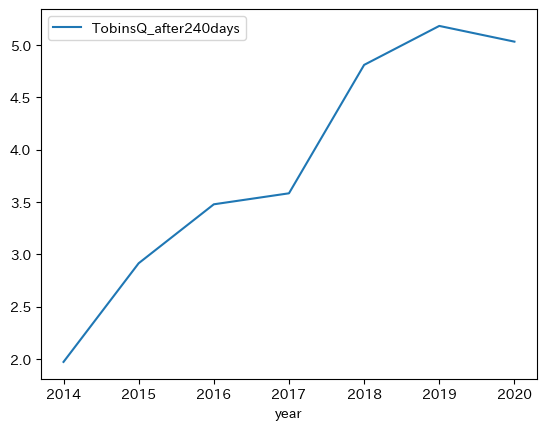

In [4]:
df_network_Zaimu[df_network_Zaimu["code"] == 6098][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

<AxesSubplot: xlabel='year'>

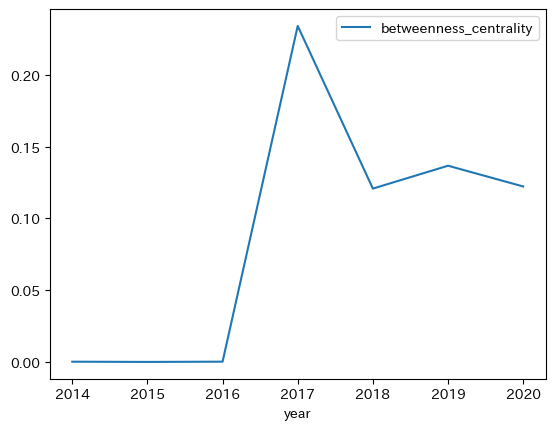

In [5]:
df_network_Zaimu[df_network_Zaimu["code"] == 6098][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

<AxesSubplot: xlabel='year'>

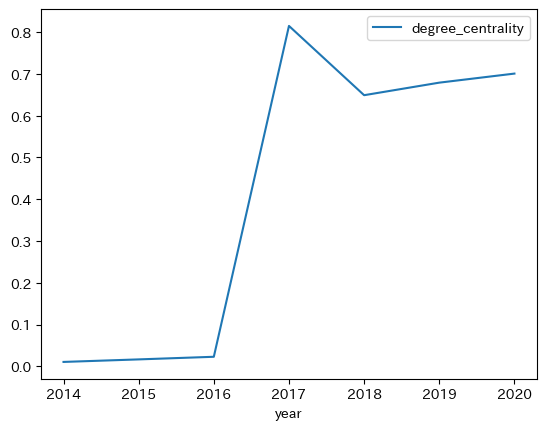

In [7]:
df_network_Zaimu[df_network_Zaimu["code"] == 6098][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

### ネクソン

<AxesSubplot: xlabel='year'>

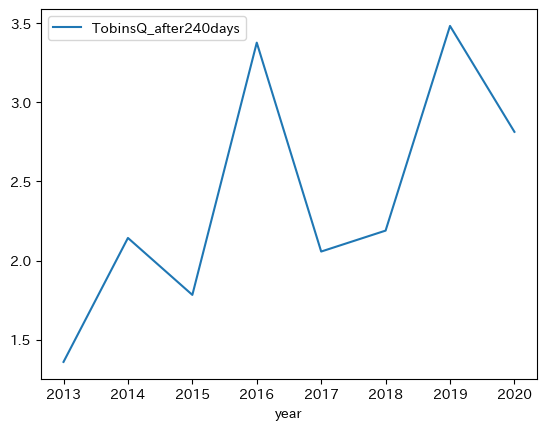

In [9]:
df_network_Zaimu[df_network_Zaimu["code"] == 3659][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

<AxesSubplot: xlabel='year'>

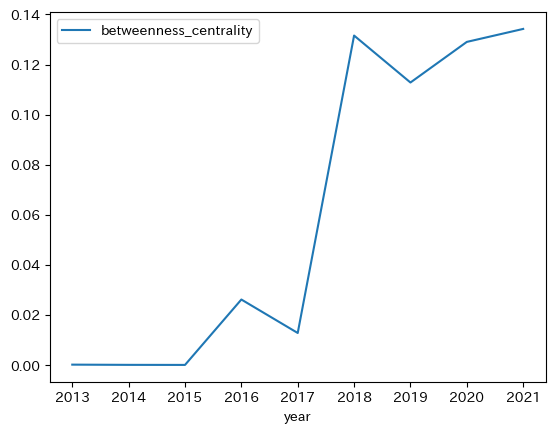

In [11]:
df_network_Zaimu[df_network_Zaimu["code"] == 3659][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

<AxesSubplot: xlabel='year'>

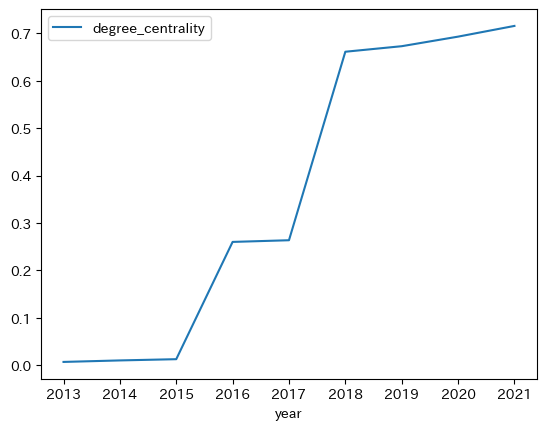

In [12]:
df_network_Zaimu[df_network_Zaimu["code"] == 3659][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

### キリン

<AxesSubplot: xlabel='year'>

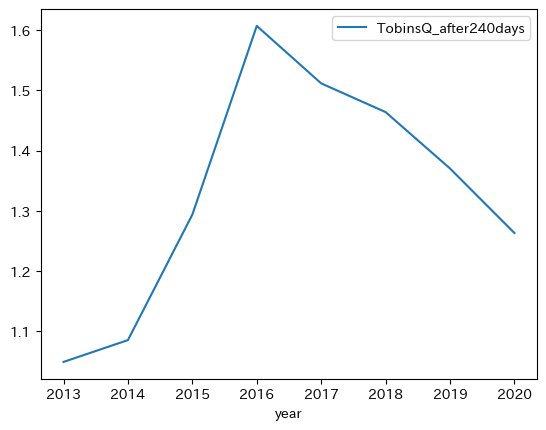

In [17]:
df_network_Zaimu[df_network_Zaimu["code"] == 2503][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

<AxesSubplot: xlabel='year'>

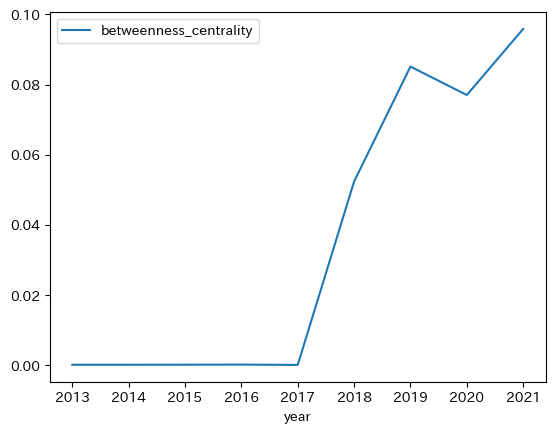

In [16]:
df_network_Zaimu[df_network_Zaimu["code"] == 2503][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

<AxesSubplot: xlabel='year'>

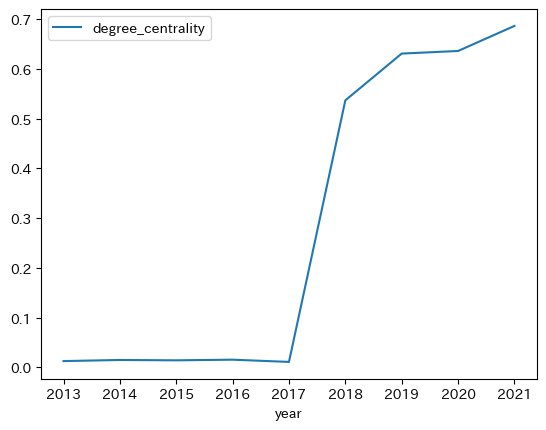

In [15]:
df_network_Zaimu[df_network_Zaimu["code"] == 2503][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

### 東京建物

<AxesSubplot: xlabel='year'>

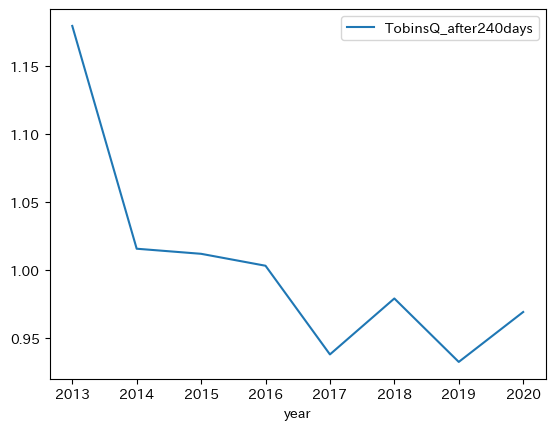

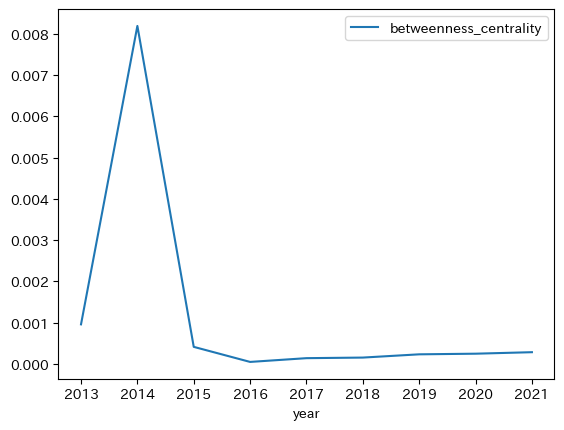

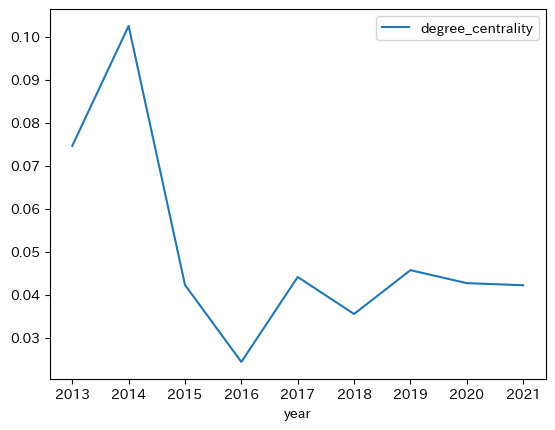

In [20]:
df_network_Zaimu[df_network_Zaimu["code"] == 8804][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

df_network_Zaimu[df_network_Zaimu["code"] == 8804][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

df_network_Zaimu[df_network_Zaimu["code"] == 8804][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

In [26]:
df_network_Zaimu[df_network_Zaimu["code"] == 6861]

,code,name,startday,endday,submitday,text,year,sec_code,type_33_code,type_33,...,Capitalinvestment_in_TotalAsset,FixedAsset_in_TotalAsset,CashHoldings,AssetLeverage,RDIntensity,Profitability,TobinsQ_after180days,TobinsQ_after240days,TobinsQ_after300days,TobinsQ_after360days
543,6861,株式会社キーエンス,2013-03-21,2014-03-20,2014-06-13,当連結会計年度の世界経済は、新興国で成長の鈍化がみられましたが、米国をはじめとする先...,2013,68610.0,3650,電気機器,...,0.003883,0.315013,0.558683,0.067238,0.011498,0.099636,3.818980,4.105298,4.103478,4.176682
3716,6861,株式会社キーエンス,2014-03-21,2015-03-20,2015-06-15,(1)業績当連結会計年度の世界経済は、先進国では、原油価格の下落や欧州の債務問題等の影響を...,2014,68610.0,3650,電気機器,...,0.003021,0.224801,0.642083,0.073556,0.010152,0.121465,4.057725,3.358009,3.331359,3.805297


<AxesSubplot: xlabel='year'>

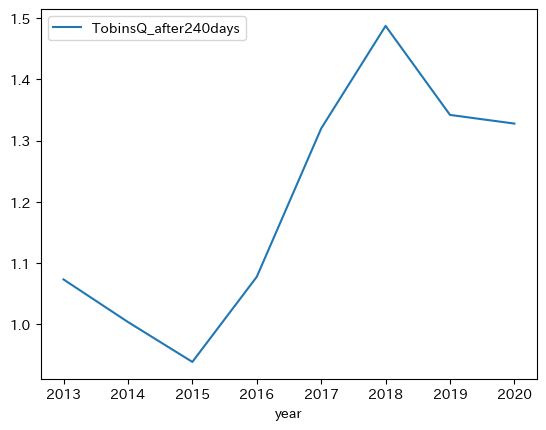

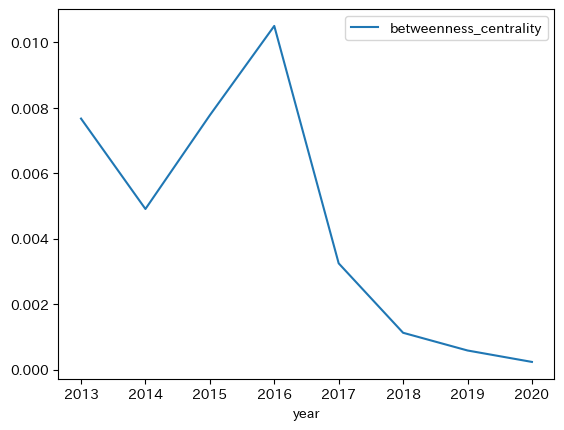

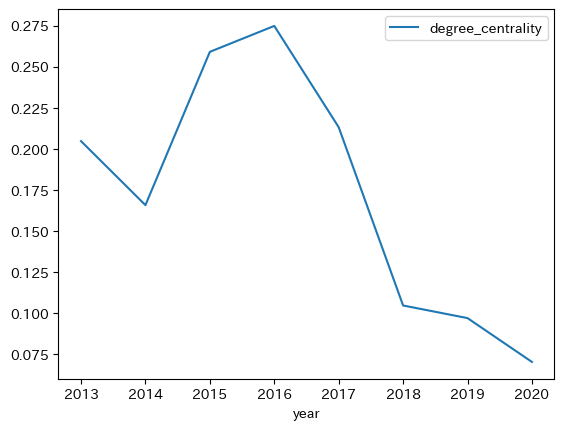

In [32]:
df_network_Zaimu[df_network_Zaimu["code"] == 3054][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

df_network_Zaimu[df_network_Zaimu["code"] == 3054][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

df_network_Zaimu[df_network_Zaimu["code"] == 3054][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

In [166]:
df_network_Zaimu["betweenness_centrality"].describe()

count    28826.000000
mean         0.000347
std          0.002652
min          0.000000
25%          0.000039
50%          0.000127
75%          0.000331
max          0.234220
Name: betweenness_centrality, dtype: float64

### KDDI

<AxesSubplot: xlabel='year'>

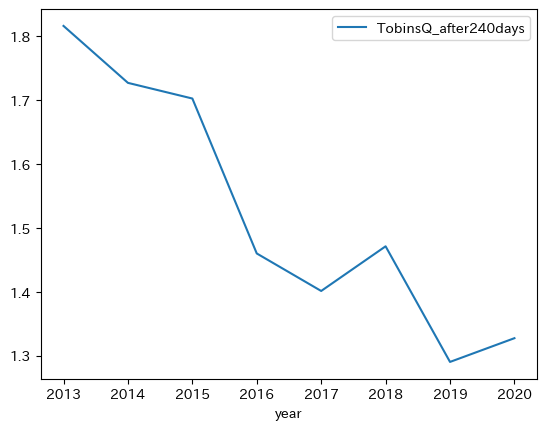

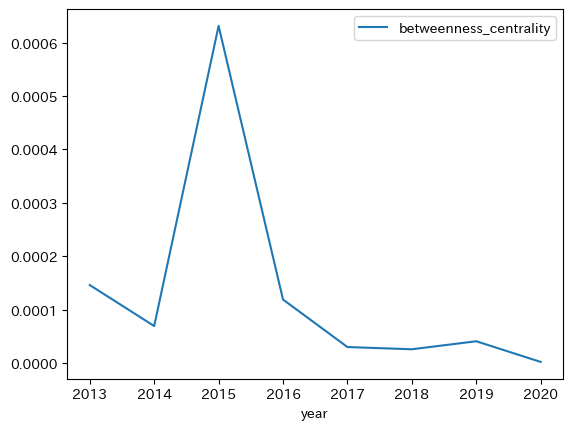

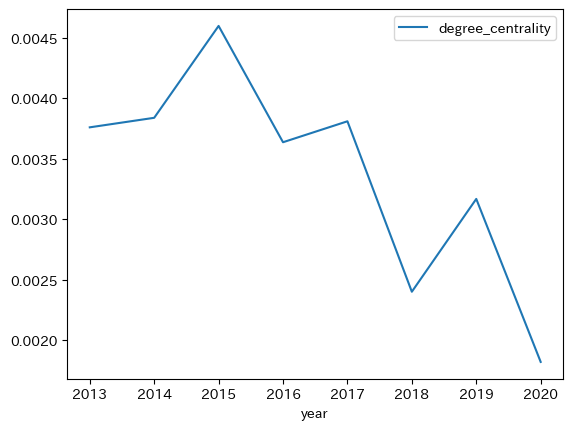

In [25]:
df_network_Zaimu[df_network_Zaimu["code"] == 9433][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

df_network_Zaimu[df_network_Zaimu["code"] == 9433][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

df_network_Zaimu[df_network_Zaimu["code"] == 9433][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

### 楽天

<AxesSubplot: xlabel='year'>

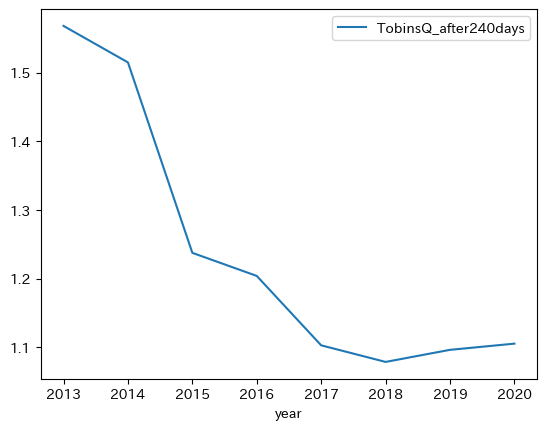

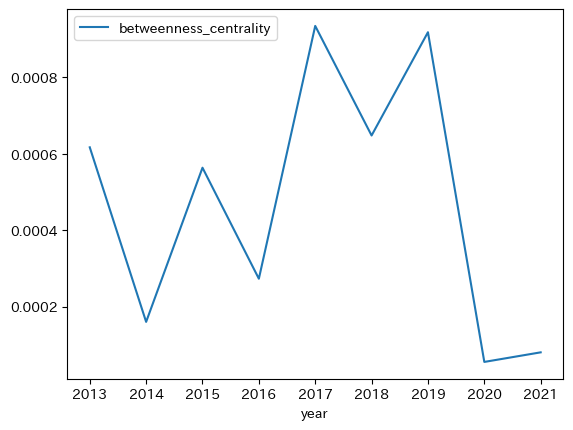

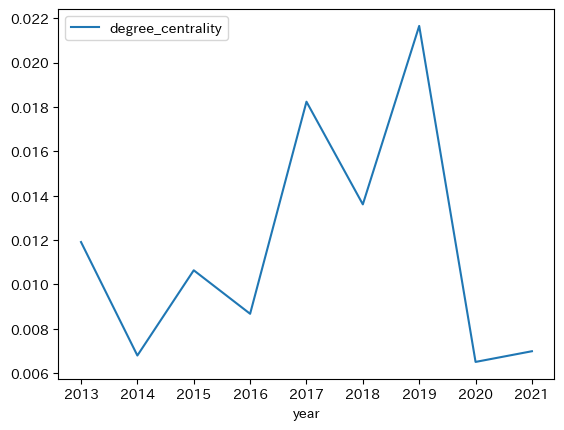

In [24]:
df_network_Zaimu[df_network_Zaimu["code"] == 4755][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

df_network_Zaimu[df_network_Zaimu["code"] == 4755][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

df_network_Zaimu[df_network_Zaimu["code"] == 4755][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

### NTT

<AxesSubplot: xlabel='year'>

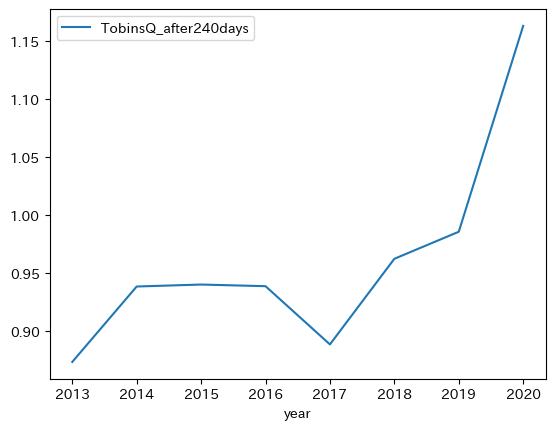

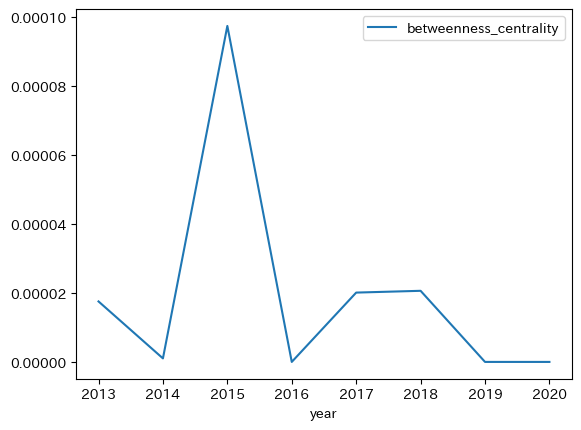

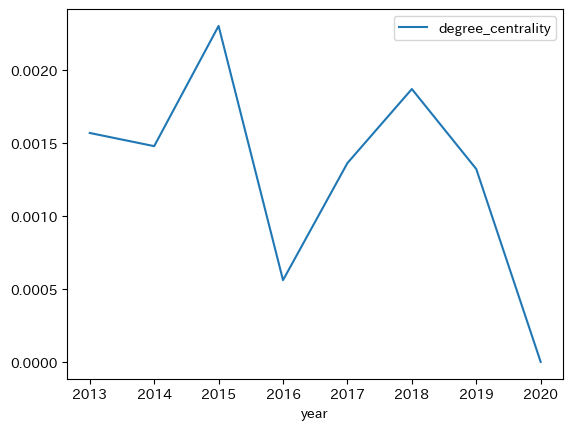

In [14]:
df_network_Zaimu[df_network_Zaimu["code"] == 9432][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

df_network_Zaimu[df_network_Zaimu["code"] == 9432][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

df_network_Zaimu[df_network_Zaimu["code"] == 9432][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

### ソフトバンクグループ

<AxesSubplot: xlabel='year'>

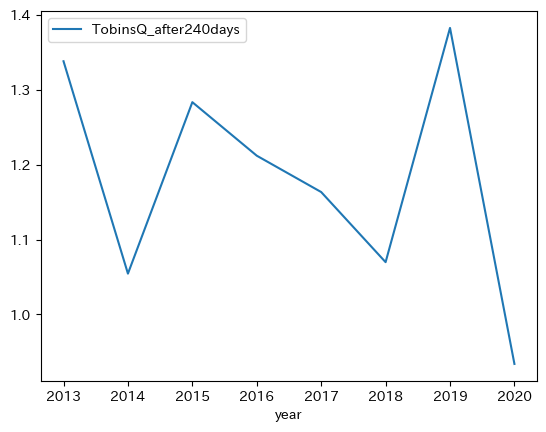

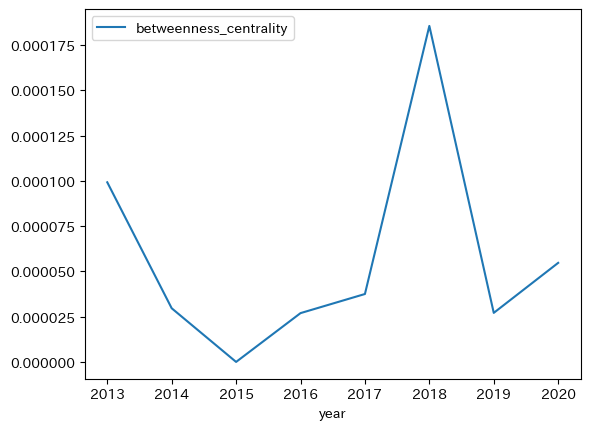

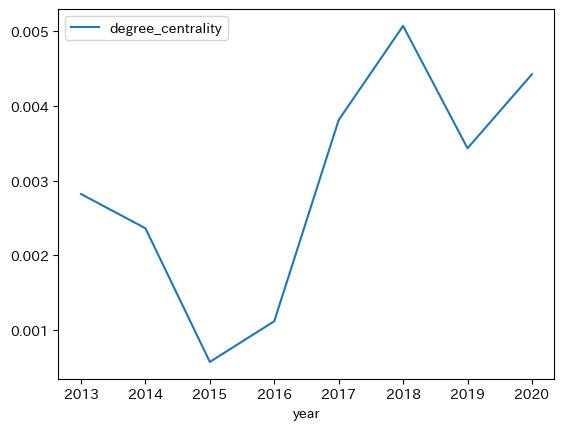

In [19]:
df_network_Zaimu[df_network_Zaimu["code"] == 9984][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["TobinsQ_after240days"])

df_network_Zaimu[df_network_Zaimu["code"] == 9984][["year","TobinsQ_after240days","betweenness_centrality"]].plot(x="year",y=["betweenness_centrality"])

df_network_Zaimu[df_network_Zaimu["code"] == 9984][["year","TobinsQ_after240days","degree_centrality"]].plot(x="year",y=["degree_centrality"])

In [31]:
df_network_Zaimu.sort_values(by="betweenness_centrality",ascending=False).iloc[49:80,:]

,code,name,startday,endday,submitday,text,year,sec_code,type_33_code,type_33,...,Capitalinvestment_in_TotalAsset,FixedAsset_in_TotalAsset,CashHoldings,AssetLeverage,RDIntensity,Profitability,TobinsQ_after180days,TobinsQ_after240days,TobinsQ_after300days,TobinsQ_after360days
54,2743,ピクセルカンパニーズ株式会社,2013-01-01,2013-12-31,2014-03-31,(1)業績当連結会計年度におけるわが国の経済は、政府や日銀の経済・金融政策への期待感を背景...,2013,27430.0,6050,卸売業,...,0.079723,0.114740,0.165536,0.784221,0.000000,-0.022837,1.041264,0.973037,0.980970,0.957170
4582,9639,三協フロンテア株式会社,2014-04-01,2015-03-31,2015-06-24,(1)業績当連結会計年度における我が国経済は、企業収益の回復を受け日経平均株価も堅調に推移...,2014,96390.0,9050,サービス業,...,0.210862,0.773629,0.049609,0.554945,0.003757,0.043791,0.959030,0.902332,0.916447,0.918652
1312,6928,株式会社エノモト,2013-04-01,2014-03-31,2014-06-27,(1)業績当連結会計年度におけるわが国経済は、政府の経済政策を背景に円安・株高基調が進み...,2013,69280.0,3650,電気機器,...,0.036670,0.593431,0.102310,0.496097,0.001834,-0.037351,0.775904,0.808066,0.835386,0.796181
3114,8996,株式会社ハウスフリーダム,2014-01-01,2014-12-31,2015-03-20,(1)業績当連結会計年度におけるわが国経済は、政府による経済政策や金融緩和政策の効果等によ...,2014,89960.0,8050,不動産業,...,0.126385,0.383830,0.377078,0.669841,0.000000,0.033414,NaN,NaN,NaN,NaN
7734,9639,三協フロンテア株式会社,2015-04-01,2016-03-31,2016-06-24,(1)業績当連結会計年度における我が国経済は、政府による積極的な経済政策や金融政策などを...,2015,96390.0,9050,サービス業,...,0.142660,0.758696,0.053118,0.530534,0.003871,0.048472,1.069489,1.167401,1.053326,1.060475
6779,8125,株式会社ワキタ,2015-03-01,2016-02-29,2016-05-27,当連結会計年度(平成27年3月1日~平成28年2月29日)におけるわが国経済は、政府による...,2015,81250.0,6050,卸売業,...,0.096523,0.572850,0.209777,0.228348,0.000000,0.041138,0.656452,0.715387,0.728589,0.793279
4728,7451,三菱食品株式会社,2014-04-01,2015-03-31,2015-06-25,(1)業績当連結会計年度におけるわが国経済は、政府の経済政策や日本銀行の金融政策により緩や...,2014,74510.0,6050,卸売業,...,0.015927,0.208570,0.011346,0.759142,0.000000,0.016894,1.056723,1.054809,1.031254,1.015641
7319,3583,オーベクス株式会社,2015-04-01,2016-03-31,2016-06-24,当連結会計年度におけるわが国経済は、政府の財政および金融政策により企業業績や雇用環境の改...,2015,35830.0,3100,繊維製品,...,0.105812,0.355462,0.260969,0.479461,0.009411,0.058375,1.212990,1.002566,0.887624,0.906530
286,4334,株式会社ユークス,2013-02-01,2014-01-31,2014-04-25,(1)業績当連結会計年度におけるわが国経済は、各種政策の効果が下支えするなかで、家計所...,2013,43340.0,5250,情報・通信業,...,0.014470,0.215207,0.512760,0.252828,0.075243,0.124704,2.853862,2.483120,2.258340,1.881981
18130,8338,株式会社筑波銀行,2018-04-01,2019-03-31,2019-06-25,以下の記載における将来に関する事項は、当連結会計年度の末日現在において当行及び連結子会社(...,2018,83380.0,7050,銀行業,...,0.000000,NaN,0.291671,0.954006,0.000000,0.000451,0.969950,0.966456,0.966198,0.967159


## Rを使用した回帰分析

In [43]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'degree_centrality']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'degree_centrality'
csr_label = "'degree_centrality'='degree_centrality'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180 | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240 | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300 | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360 | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|
|degree_centrality               | -2.39360*** |      -0.73855      |     -0.18727     | -2.55282*** |      -0.93975      |     0.00789      | -2.51596*** |     -0.98817*      |     0.04781      | -2.81143*** |     -1.19302**     |     0.06185      |
|                               

In [147]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'degree_centrality']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'degree_centrality'
csr_label = "'degree_centrality'='degree_centrality'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180 | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240 | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300 | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360 | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|
|degree_centrality               | -2.39360*** |      -0.73855      |     -0.18727     | -2.55282*** |      -0.93975      |     0.00789      | -2.51596*** |     -0.98817*      |     0.04781      | -2.81143*** |     -1.19302**     |     0.06185      |
|                               

In [146]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'betweenness_centrality']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'betweenness_centrality'
csr_label = "'betweenness_centrality'='betweenness_centrality'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180 | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240 | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300 | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360 | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|
|betweenness_centrality          |  9.55104*   |      6.28037       |    7.17724**     |  10.30457   |      7.65870       |    7.28905***    |  8.79494*   |      6.23789       |    6.44491***    |  8.46967*   |      5.91132       |    6.35802***    |
|                               

In [148]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'eigenvector_centrality']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'eigenvector_centrality'
csr_label = "'eigenvector_centrality'='eigenvector_centrality'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180  | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240  | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300  | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360  | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:------------:|:------------------:|:----------------:|:------------:|:------------------:|:----------------:|:------------:|:------------------:|:----------------:|:------------:|:------------------:|:----------------:|
|eigenvector_centrality          | -20.46073*** |    -10.64219***    |     -0.31631     | -20.13837*** |    -10.53211***    |     0.67867      | -19.37944*** |    -10.18354***    |     0.64587      | -20.91339*** |    -11.31818***    |     0.71287      |
|                   

In [150]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'closeness_centrality']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'closeness_centrality'
csr_label = "'closeness_centrality'='closeness_centrality'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180 | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240 | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300 | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360 | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|
|closeness_centrality            | -4.29391*** |    -2.72028***     |     -0.58703     | -4.53809*** |    -3.02862***     |     -0.35575     | -4.17552*** |    -2.69411***     |     -0.27360     | -4.50122*** |    -2.93225***     |     -0.37787     |
|                               

In [149]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'clustering']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'clustering'
csr_label = "'clustering'='clustering'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180 | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240 | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300 | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360 | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|
|clustering                      | 0.55400***  |     0.48541***     |     0.31430*     | 0.46334***  |     0.38029***     |     0.26522      | 0.42670***  |     0.34039**      |     0.14674      | 0.40373***  |     0.32072**      |     0.14873      |
|                               

In [26]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'degree_centrality', 'betweenness_centrality', 'eigenvector_centrality', 'closeness_centrality', 'clustering']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'degree_centrality+betweenness_centrality'
csr_label = "'degree_centrality'='degree_centrality', 'betweenness_centrality'='betweenness_centrality'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180 | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240 | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300 | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360 | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|:-----------:|:------------------:|:----------------:|
|degree_centrality               | -3.16967*** |      -1.14518      |    -0.73416**    | -3.31032*** |     -1.39976**     |     -0.43802     | -3.22797*** |    -1.41420***     |     -0.33301     | -3.56243*** |    -1.64943***     |     -0.34597     |
|                               

In [151]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'degree_centrality', 'betweenness_centrality', 'eigenvector_centrality', 'closeness_centrality', 'clustering']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'degree_centrality+betweenness_centrality+eigenvector_centrality+closeness_centrality+clustering'
csr_label = "'degree_centrality'='degree_centrality', 'betweenness_centrality'='betweenness_centrality', 'eigenvector_centrality'='eigenvector_centrality', 'closeness_centrality'='closeness_centrality', 'clustering'='clustering'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180  | TobinsQ_180_sector | TobinsQ_180_firm | TobinsQ_240  | TobinsQ_240_sector | TobinsQ_240_firm | TobinsQ_300  | TobinsQ_300_sector | TobinsQ_300_firm | TobinsQ_360  | TobinsQ_360_sector | TobinsQ_360_firm |
|:-------------------------------|:------------:|:------------------:|:----------------:|:------------:|:------------------:|:----------------:|:------------:|:------------------:|:----------------:|:------------:|:------------------:|:----------------:|
|degree_centrality               | 16.55235***  |    14.56260***     |    -1.47696*     | 15.32521***  |    12.71295***     |     -1.32616     | 14.08348***  |    11.27578***     |     -1.14310     | 14.50218***  |    11.56277***     |     -1.08296     |
|                   

In [630]:
df_TTR_α_reg = df_network_Zaimu.rename(columns={"東証業種ｺｰﾄﾞ":"sector","期日":"fiscalyear"})
df_TTR_α_reg["sector"] = df_TTR_α_reg["sector"].astype("int64")
df_TTR_α_reg = df_TTR_α_reg[['TobinsQ_after180days',"TobinsQ_after240days","TobinsQ_after300days","TobinsQ_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'degree']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'degree'
csr_label = "'degree'='degree'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
# r(f"results[['TobinsQ_180']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_180_firm']] <- lm_robust(TobinsQ_after180days~{csr}+{control},fixed_effects=code,data=data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_240']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_240_firm']] <- lm_robust(TobinsQ_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_300']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_300_firm']] <- lm_robust(TobinsQ_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_360']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
# r(f"results[['TobinsQ_360_firm']] <- lm_robust(TobinsQ_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))

try({msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)})


|                                | TobinsQ_180_sector | TobinsQ_240_sector | TobinsQ_300_sector | TobinsQ_360_sector |
|:-------------------------------|:------------------:|:------------------:|:------------------:|:------------------:|
|degree                          |      54.39004      |      9.52516       |    -46.49797**     |    -60.39402**     |
|                                |     (0.92694)      |     (0.24034)      |     (-2.22065)     |     (-2.44015)     |
|Ln_TotalAsset                   |      -0.02527      |      -0.04000      |      -0.04790      |      -0.06000      |
|                                |     (-0.63322)     |     (-0.85594)     |     (-0.97280)     |     (-1.14140)     |
|SalesGrowthRate                 |     0.02669**      |     0.01863*** 

In [ ]:
df_TTR_α_reg = df_Zaimu_TTR_wiki.rename(columns={"東証業種ｺｰﾄﾞ":"sector","銘柄コード":"code"})

df_TTR_α_reg = df_TTR_α_reg[["vol_FF3_after180days","vol_FF3_after240days","vol_FF3_after300days","vol_FF3_after360days",
                             'TobinsQ_3_PBR', 'Ln_NetAsset', 'Ln_TotalAsset', 'SalesGrowthRate',
                             'Capitalinvestment_in_TotalAsset', 'FixedAsset_in_TotalAsset',
                             'CashHoldings', 'AssetLeverage', 'RDIntensity', 'Profitability',"sector","code",'TobinsQ_1_net','fiscalyear',
                             'ESG_TTR_all_tfidf','views','ESG_views']]
control = 'Ln_TotalAsset+SalesGrowthRate+Capitalinvestment_in_TotalAsset+FixedAsset_in_TotalAsset+CashHoldings+AssetLeverage+RDIntensity+Profitability'
control_label= "'Ln_TotalAsset'='Ln_TotalAsset',\
'SalesGrowthRate'='SalesGrowthRate','Capitalinvestment_in_TotalAsset'='Capitalinvestment_in_TotalAsset',\
'FixedAsset_in_TotalAsset'='FixedAsset_in_TotalAsset','CashHoldings'='CashHoldings', \
'AssetLeverage'='AssetLeverage', 'RDIntensity'='RDIntensity', 'Profitability'='Profitability'"

csr = 'ESG_views+views+ESG_TTR_all_tfidf'
csr_label = "'ESG_views'='ESG*views','views'='views','ESG_TTR_all_tfidf'='ESG'"
r = pyper.R(use_pandas='True')
r("library(estimatr)")
r("library(tidyverse)")
r("library(modelsummary)")
r("library(tibble)")
r.assign('data',df_TTR_α_reg)
# R のソースコードを実行する



r("results <- list()")
r(f"results[['TobinsQ_180']] <- lm_robust(vol_FF3_after180days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_sector']] <- lm_robust(vol_FF3_after180days~{csr}+{control},fixed_effects=sector+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_180_firm']] <- lm_robust(vol_FF3_after180days~{csr}+{control},fixed_effects=code+fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240']] <- lm_robust(vol_FF3_after240days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_sector']] <- lm_robust(vol_FF3_after240days~{csr}+{control},fixed_effects=sector+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_240_firm']] <- lm_robust(vol_FF3_after240days~{csr}+{control},fixed_effects=code+fiscalyear,data = data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300']] <- lm_robust(vol_FF3_after300days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_sector']] <- lm_robust(vol_FF3_after300days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_300_firm']] <- lm_robust(vol_FF3_after300days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360']] <- lm_robust(vol_FF3_after360days~{csr}+{control},fixed_effects=fiscalyear,data=data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_sector']] <- lm_robust(vol_FF3_after360days~{csr}+{control},fixed_effects=sector+fiscalyear,data= data,clusters = sector,se_type='CR2')")
r(f"results[['TobinsQ_360_firm']] <- lm_robust(vol_FF3_after360days~{csr}+{control},fixed_effects=code+fiscalyear,data= data,clusters = sector,se_type='CR2')")


r("gof_custom <- modelsummary::gof_map")
r("gof_custom$omit[gof_custom$raw == 'r.squared'] <- TRUE")
r("gof_custom$omit[gof_custom$raw == 'r2'] <- TRUE")
r(f"var_nam = c({csr_label}, {control_label})")

# r("rows <- tribble(~term, ~MODEL A_0, ~MODEL A_0_sector, ~MODEL A_60, ~MODEL A_60_sector, ~MODEL A_120, ~MODEL A_120_sector, ~MODEL A_180, ~MODEL A_180_sector,'FE1', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No','FE2','No', 'No', 'No', 'No', 'No', 'No', 'No', 'No')")
# r("attr(rows, 'position') <- c(4,5)")
# print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.2f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom, add_rows = rows)"))
print(r("msummary(results, 'markdown',stars = c('*' = .1, '**' = .05, '***' = .01), gof_omit = 'AIC|BIC|Log.Lik.|F|RMSE|Std.Errors',  fmt = '%.5f' ,statistic = 'statistic', coef_map = var_nam, gof_map = gof_custom)"))